# Dashboard de Terremotos a Nivel Mundial

Crear un **dashboard interactivo utilizando Plotly y Dash**. 

Con esa información desarrollar un conjunto de visualizaciones interactivas que proporcionen una comprensión profunda de los patrones y tendencias de los terremotos. Este ejercicio te permitirá aplicar conocimientos adquiridos sobre visualización de datos y desarrollo de dashboards con herramientas de Python.

El dataset contiene información detallada sobre terremotos, incluyendo:
+ fecha y hora del evento
+ magnitud
+ profundidad
+ país en el que ocurrió.

Utilizar esta información para crear varios gráficos interactivos que ayudarán a explorar y presentar los datos de manera efectiva.

### Consigna

Desarrollar un dashboard interactivo utilizando **Plotly** y **Dash** para visualizar los datos de terremotos proporcionados en el archivo `earthquake data.csv`. 

Asegúrate de que el dashboard tenga un diseño limpio y organizado, con títulos claros y descripciones para cada gráfico.

1. **Cargar y Preparar los Datos**: Carga el archivo `earthquake data.csv` y realiza las transformaciones necesarias, como convertir la columna de fecha y hora al formato datetime.

2. **Creación de Gráficos**: Crea los siguientes gráficos usando plotly:
    + **Mapa Coroplético**: Un mapa coroplético que muestre la densidad de terremotos por región.
    + **Gráfico de Barras**: Un gráfico de barras que muestre el número de terremotos por magnitud.
    + **Gráfico de Líneas**: Un gráfico de líneas que muestre la tendencia de la magnitud de los terremotos a lo largo del tiempo.
    + **Gráfico de Dispersión**: Un gráfico de dispersión que muestre la relación entre la magnitud de los terremotos y su profundidad.
    + **Gráfico 3D**: Un gráfico 3D que visualice la relación entre magnitud, profundidad y tiempo.

3. **Diseño de la Aplicación**: Usando Dash, crea la aplicación con el Layout del Dashboard, en el que deben desplegarse todos los gráficos que has preparado. Finalmente ejecuta la aplicación.

In [6]:
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import dash
from dash import dcc, html


In [8]:
ruta = "C:/Users/crist/OneDrive/Escritorio/Data Scient/earthquake+data.csv"
df = pd.read_csv(ruta)
df.head() 

,Date & Time,Latitude,Longitude,Depth,Magnitude,Lands,Country
0,11/21/2023 16:36,38243.0,38808.0,7,1.0,EASTERN,TURKEY
1,11/21/2023 15:59,39134.0,29026.0,10,1.0,WESTERN,TURKEY
2,11/21/2023 13:00,39636.0,30104.0,7,1.0,WESTERN,TURKEY
3,11/20/2023 18:43,47368.0,6918.0,5,1.0,SWITZERLAND,SWITZERLAND
4,11/19/2023 10:48,37175.0,36892.0,7,1.0,CENTRAL,TURKEY


In [10]:
# Transformar información de tiemp en formato datetime
df['Date & Time'] = pd.to_datetime(df['Date & Time'])

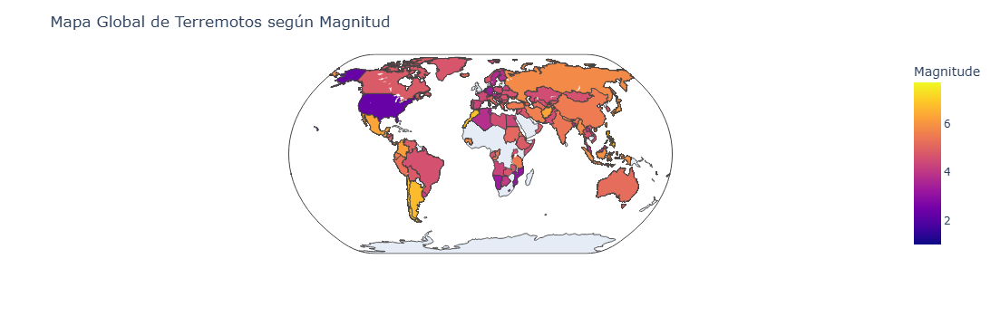

In [14]:
# Mapa Coroplético
fig1 = px.choropleth(df,
                     locations="Country",
                     locationmode='country names',
                     color="Magnitude",
                     hover_name="Country",
                     projection="natural earth")
fig1.update_layout(title="Mapa Global de Terremotos según Magnitud")

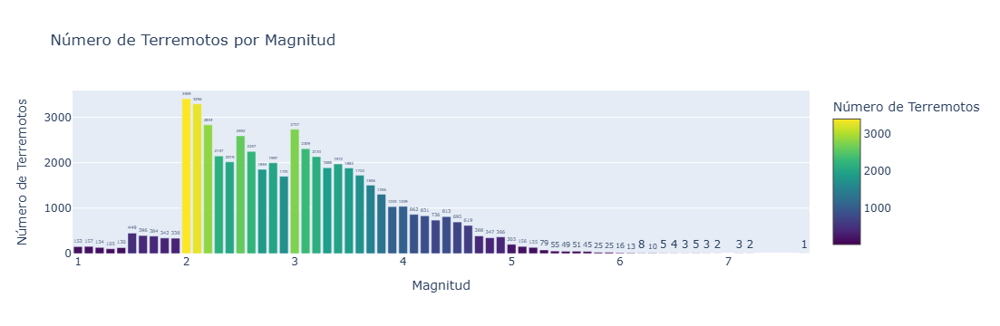

In [16]:
# Gráfico de barras 
magnitudes = df["Magnitude"].value_counts().sort_index()
fig2 = go.Figure(go.Bar(x=magnitudes.index, 
                       y=magnitudes.values, 
                       marker=dict(
                           color=magnitudes.values, 
                           colorscale="Viridis", 
                           showscale=True, 
                           colorbar=dict(title="Número de Terremotos")), 
                       text=magnitudes.values, 
                       textposition="outside"))
fig2.update_layout(
    title="Número de Terremotos por Magnitud",
    xaxis_title = "Magnitud", 
    yaxis_title = "Número de Terremotos"
)

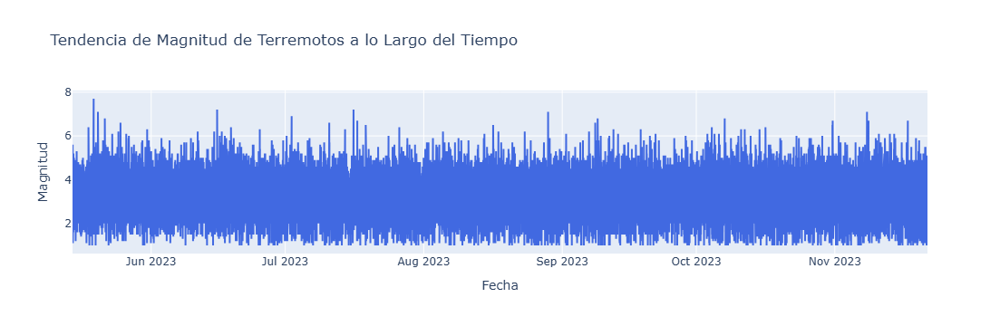

In [18]:
# Gráfico de líneas
df.sort_values('Date & Time', inplace=True)
fig3 = go.Figure(go.Scatter(x=df['Date & Time'],
                            y=df['Magnitude'],
                            mode='lines',
                            line=dict(color='royalblue',
                                      width=2),
                            text=df['Magnitude'],
                            textposition='top center'))
fig3.update_layout(
    title="Tendencia de Magnitud de Terremotos a lo Largo del Tiempo",
    xaxis_title="Fecha",
    yaxis_title="Magnitud")

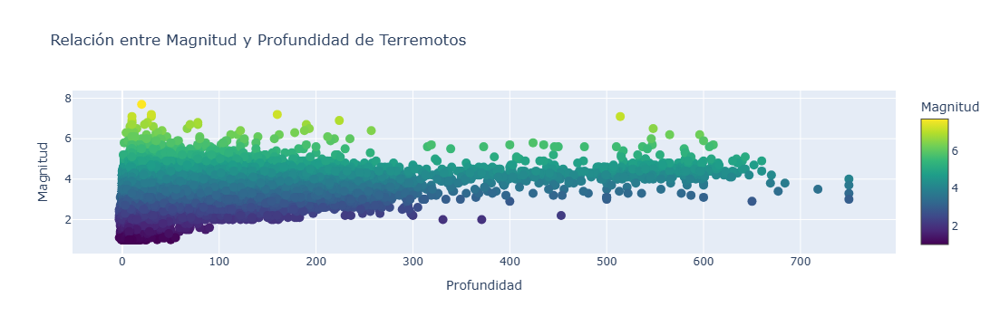

In [20]:
# Gráfico de dispersión
fig4 = go.Figure(go.Scatter(x=df['Depth'],
                            y=df['Magnitude'],
                            mode='markers',
                            marker=dict(size=10,
                                        color=df['Magnitude'],
                                        colorscale='Viridis',
                                        showscale=True,
                                        colorbar=dict(title="Magnitud")),
                            text=df['Magnitude'],
                            hoverinfo='text+x+y'))
fig4.update_layout(
    title="Relación entre Magnitud y Profundidad de Terremotos",
    xaxis_title="Profundidad",
    yaxis_title="Magnitud")

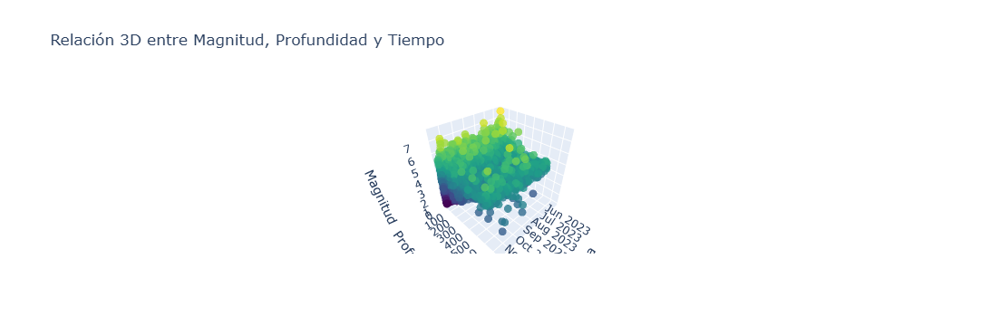

In [22]:
# Gráfico 3d
fig5 = go.Figure(go.Scatter3d(x=df['Date & Time'],
                              y=df['Depth'],
                              z=df['Magnitude'],
                              mode='markers',
                              marker=dict(size=5,
                                          color=df['Magnitude'],
                                          colorscale='Viridis',
                                          opacity=0.8)))
fig5.update_layout(title="Relación 3D entre Magnitud, Profundidad y Tiempo",
                   scene=dict(xaxis_title='Fecha',
                              yaxis_title='Profundidad',
                              zaxis_title='Magnitud'))

In [24]:
# Inicializar la aplicación Dash
app = dash.Dash(__name__)

In [26]:
# Creación del Layout general de la app
app.layout = html.Div([
    html.H1("Dashboard de Terremotos"),
    dcc.Graph(id='mapa-coropleto',
             figure=fig1),
    dcc.Graph(id='grafico-barras',
             figure=fig2),
    dcc.Graph(id='grafico-lineas',
             figure=fig3),
    dcc.Graph(id='grafico-dispersion',
             figure=fig4),
    dcc.Graph(id='grafico-3d',
             figure=fig5)])

In [28]:
# Ejecutar la aplicación
if __name__ == '__main__':
    app.run_server(debug=True)